In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as pltimage

In [2]:
import imageio

In [3]:
from pycocotools.coco import COCO
from pathlib import Path
import os

In [4]:
def maskImg(img, threshold):
    mask = img.copy()
    mask[mask <= threshold] = 0#np.nan
    return mask

def plot_mask(img, msk, alpha=0.3, threshold=0):
    fig, axarr = plt.subplots(1,2, figsize=(20, 8))
    
    axarr[0].imshow(img, cmap='viridis', interpolation='None')
    axarr[1].imshow(img, cmap='viridis', interpolation='None')
    axarr[1].imshow(maskImg(msk, threshold), alpha=alpha, cmap='hot', interpolation='None')

    plt.show()

In [5]:
base_dir = 'C:/Users/joao/Desktop/tese/datasets-lymph'

# WSSS4LUAD - GrandChallenge

https://wsss4luad.grand-challenge.org/Datasets/

Tem mais pra baixar aqui:
https://drive.google.com/drive/folders/1qTTTaHAp8HOnvxnKi1RXp-bC7sito9DF

In [49]:
im = Image.open(base_dir+'/WSSS4LUAD/2.validation/img/03.png')
mk = Image.open(base_dir+'/WSSS4LUAD/2.validation/mask/03.png')

iarray = np.array(im)#.astype(float)
marray = np.array(mk)#.astype(float)
print(iarray.shape)
print(marray.shape)

print(np.unique(marray))
# 0 - tumor
# 1 - stroma
# 3 - normal

(291, 352, 3)
(291, 352)
[0 1 3]


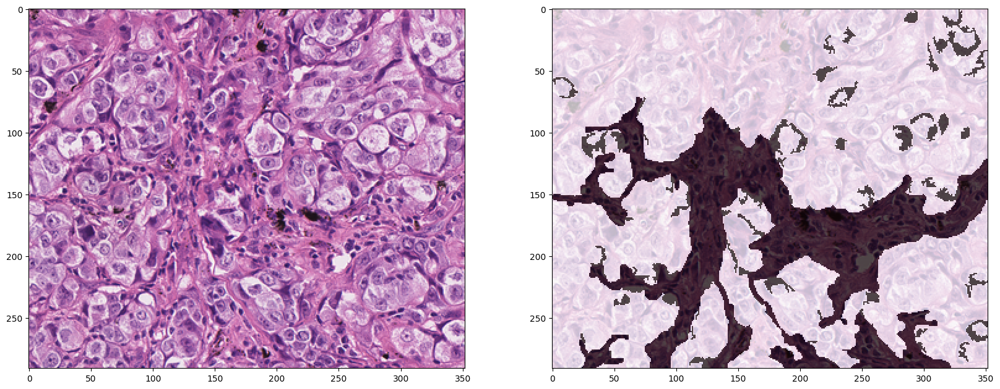

In [50]:
mfiltered = marray.copy()
mfiltered[marray == 0] = 1
mfiltered[marray != 0] = 0

plot_mask(iarray, mfiltered, alpha=0.7, threshold=0)

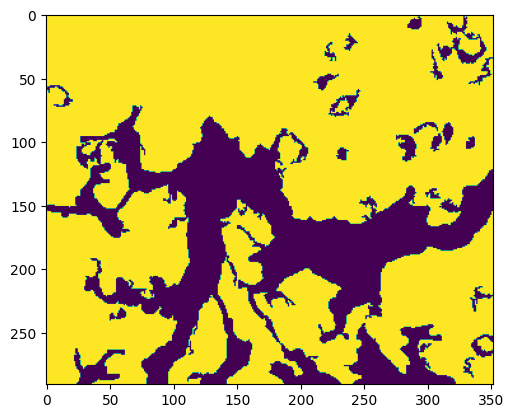

In [51]:
plt.imshow(mfiltered)

# MoNuSeg

Ja baixado, anotacoes em XML

https://monuseg.grand-challenge.org/Data/

# <font color='red'>Histopathological Images of Breast Cancer Cells - Kaggle</font>

POUCAS LABELS

https://www.kaggle.com/datasets/fhabibimoghaddam/breast-cancer-cell-histopathological-images

(768, 896, 3)
(768, 896)


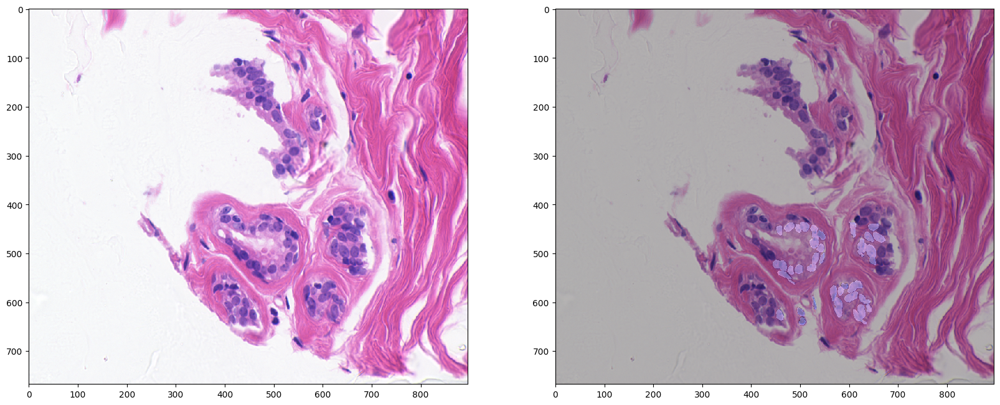

In [8]:
im = Image.open(base_dir+'/Breast Cancer Histopathological Images/Images/Ytma10_010704_benign1_ccd (2).tif')
mk = Image.open(base_dir+'/Breast Cancer Histopathological Images/Masks/Ytma10_010704_benign1 (2).tif')
# lesion - tumor?
# invasive - ?

iarray = np.array(im)#.astype(float)
marray = np.array(mk)#.astype(float)

print(iarray.shape)
print(marray.shape) # 4 canais, 3 primeiros com a mask igual, ultimo sem nada

plot_mask(iarray, marray, threshold=0)

# <font color='red'>CRC-100K</font>

NAO TEM ANOTACOES DE SEGMENTACAO, EH PRA CLASSIFICACAO

https://zenodo.org/records/1214456

# <font color='red'>InterSTELLAR - Zenodo</fron>

NAO EH DE IMAGENS

https://zenodo.org/records/7527814

In [24]:
images = np.load(base_dir+'/InterSTELLAR/graph_data.npy', allow_pickle=True)
masks = np.load(base_dir+'/InterSTELLAR/cell_masks.npy', allow_pickle=True)

print(images.shape)
print(masks.shape)

(368,)
(366,)


In [32]:
images[0][0].shape

(73, 30)

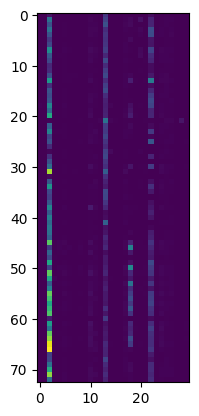

In [34]:
plt.imshow(images[0][0])

In [23]:
masks[0][0].shape

(726, 689)

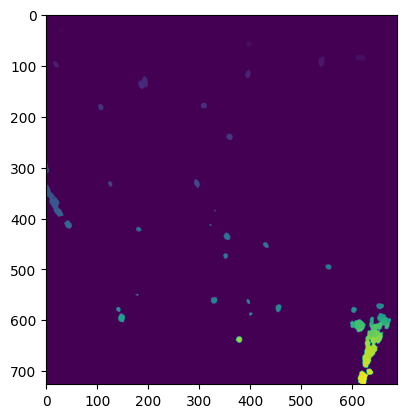

In [33]:
plt.imshow(masks[0][0])

# <font color='yellow'>Canine - Zenodo</font>

https://zenodo.org/records/7418555

In [24]:
cocoobj = COCO(base_dir+'/canine/scc.json')

loading annotations into memory...
Done (t=0.84s)
creating index...
index created!


In [29]:
catIds = cocoobj.getCatIds()
annsIds = cocoobj.getAnnIds()

In [30]:
for cat in catIds:
    Path(os.path.join(base_dir+'/canine/masks', cocoobj.loadCats(cat)[0]['name'])).mkdir(parents=True, exist_ok=True)

In [ ]:
mask = cocoobj.annToMask(cocoobj.loadAnns(1)[0])

In [ ]:
for ann in annsIds:
    # Get individual masks
    mask = cocoobj.annToMask(cocoobj.loadAnns(ann)[0])
    # Save masks to BW images
    file_path = os.path.join(base_dir+'/canine/masks',
                             cocoobj.loadCats(cocoobj.loadAnns(ann)[0]['category_id'])[0]['name'],
                             cocoobj.loadImgs(cocoobj.loadAnns(ann)[0]['image_id'])[0]['file_name'])
    pltimage.imsave(file_path, mask, cmap="gray")

# <font color='yellow'>Ometiff - zenodo</font>

https://zenodo.org/records/7540604

7Gb nao baixei

# <font color='red'>CytoNuke - zenodo</font>

POUCAS LABELS

https://zenodo.org/records/10560728

https://stackoverflow.com/questions/71508769/coco-annotations-to-masks-for-instance-segmentation-model-training

In [8]:
cocoobj = COCO(base_dir+'/CytoNuke Dataset/coco.json')

loading annotations into memory...
Done (t=0.43s)
creating index...
index created!


In [10]:
catIds = coco.getCatIds()
annsIds = coco.getAnnIds()

In [14]:
for cat in catIds:
    Path(os.path.join(base_dir+'/CytoNuke Dataset/masks', cocoobj.loadCats(cat)[0]['name'])).mkdir(parents=True, exist_ok=True)

In [18]:
for ann in annsIds:
    # Get individual masks
    mask = cocoobj.annToMask(cocoobj.loadAnns(ann)[0])
    # Save masks to BW images
    file_path = os.path.join(base_dir+'/CytoNuke Dataset/masks',
                             cocoobj.loadCats(cocoobj.loadAnns(ann)[0]['category_id'])[0]['name'],
                             cocoobj.loadImgs(cocoobj.loadAnns(ann)[0]['image_id'])[0]['file_name'])
    pltimage.imsave(file_path, mask, cmap="gray")

# <font color='red'>HASHI - Zenodo</font>

Marcações nas imagens

https://zenodo.org/records/4993672

In [12]:
im = Image.open(base_dir+'/HASHI/TCGA_imgs_idx5/TCGA-A1-A0SE-01Z-00-DX1.04B09232-C6C4-46EF-AA2C-41D078D0A80A.png')
mk = Image.open(base_dir+'/HASHI/TCGA_masks/TCGA-A1-A0SE-01Z-00-DX1.04B09232-C6C4-46EF-AA2C-41D078D0A80A.png')

iarray = np.array(im)#.astype(float)
marray = np.array(mk).astype(float)
print(iarray.shape)
print(marray.shape)

print(np.unique(marray))

(2291, 3839, 3)
(2292, 3840)
[0. 1.]


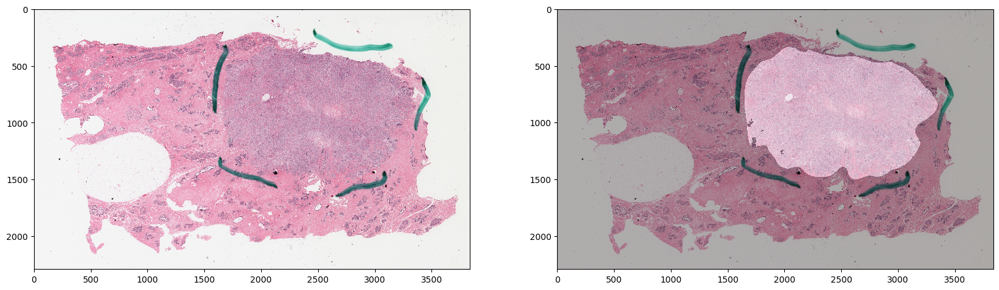

In [13]:
plot_mask(iarray, marray)

# <font color='green'>LyNSec - Zenodo</font>

USAR SÓ 1

2 NAO TEM LABEL

3 TEM CORES RUINS

https://zenodo.org/records/8065174

In [6]:
image1 = np.load(base_dir+'/lynsec/lynsec 1/0_l1.npy')
image2 = np.load(base_dir+'/lynsec/lynsec 2/100_l2.npy')
image3 = np.load(base_dir+'/lynsec/lynsec 3/10_l3.npy')
print(image1.shape)
print(image2.shape)
print(image3.shape)

(512, 512, 5)
(512, 512, 4)
(512, 512, 5)


In [7]:
print(np.unique(image1[:,:,4]))
print(np.unique(image3[:,:,4]))

# 0 - tissue
# 1 - normal
# 2 - tumor

[0 1 2]
[0 1 2]


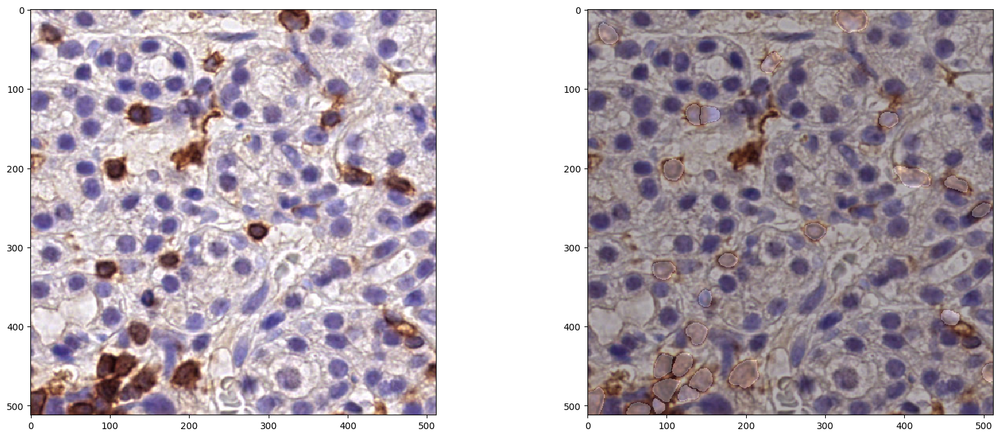

In [8]:
mfiltered = image1[:,:,4].copy()
mfiltered[mfiltered != 2] = 0

plot_mask(image1[:,:,:3], mfiltered, threshold=0)

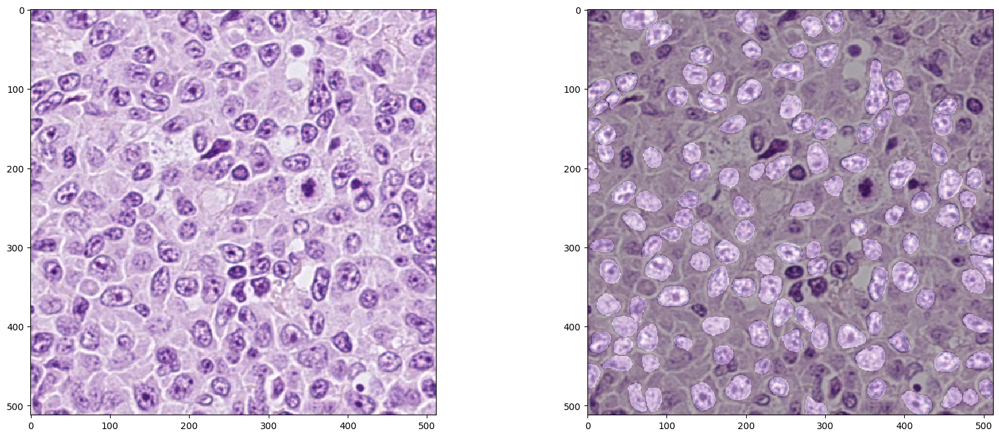

In [30]:
mfiltered = image3[:,:,4].copy()
mfiltered[mfiltered != 2] = 0

plot_mask(image3[:,:,:3], mfiltered, threshold=0)

# <font color='green'>LungFCP</font>

(4920, 4848, 3)
(4920, 4848, 4)


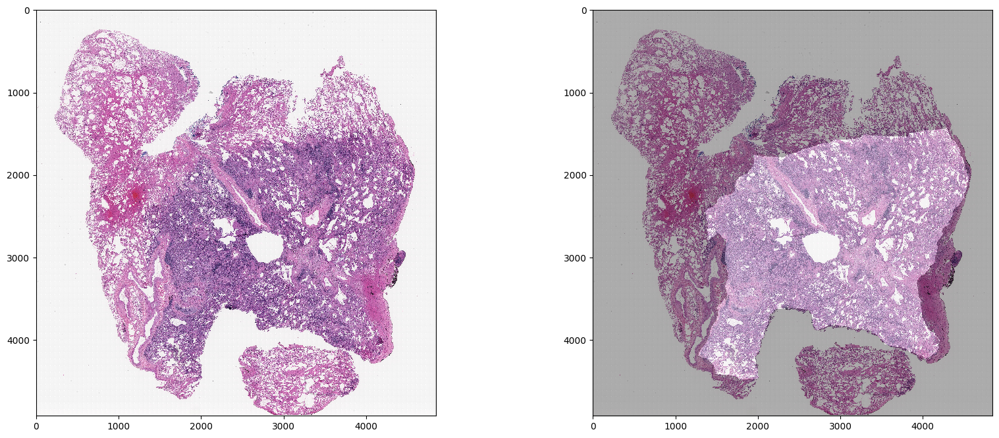

In [40]:
im = Image.open(base_dir+'/LungFCP/LungFCP-01-0001/histology/imgs/LungFCP-01-0001_B1.tif')
mk = Image.open(base_dir+'/LungFCP/LungFCP-01-0001/histology/masks/lesion/LungFCP-01-0001_B1.tif')
# lesion - tumor?
# invasive - ?

iarray = np.array(im)#.astype(float)
marray = np.array(mk)#.astype(float)

print(iarray.shape)
print(marray.shape) # 4 canais, 3 primeiros com a mask igual, ultimo sem nada

plot_mask(iarray, marray, threshold=0)

# <font color='red'>Breast Cancer Cell Segmentation</font>

POUCAS LABELS

(768, 896, 3)
(768, 896)
[  0 255]


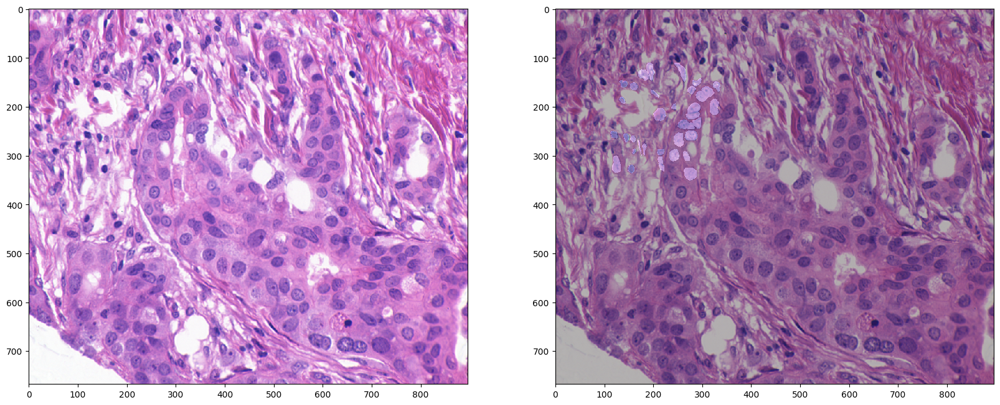

In [5]:
im = Image.open(base_dir+'/Breast Cancer Cell Segmentation/Images/ytma10_010704_malignant1_ccd.tif')
mk = Image.open(base_dir+'/Breast Cancer Cell Segmentation/Masks/ytma10_010704_malignant1.tif')

iarray = np.array(im)#.astype(float)
marray = np.array(mk)#.astype(float)

print(iarray.shape)
print(marray.shape)

print(np.unique(marray))

plot_mask(iarray, marray, threshold=255)

# <font color='green'>BCSS</font>

In [4]:
im = Image.open(base_dir+'/BCSS/rgbs_colorNormalized/TCGA-A2-A0YM-DX1_xmin44520_ymin66915_MPP-0.2500.png')
mk = Image.open(base_dir+'/BCSS/masks/TCGA-A2-A0YM-DX1_xmin44520_ymin66915_MPP-0.2500.png')

iarray = np.array(im)#.astype(float)
marray = np.array(mk)#.astype(float)
print(iarray.shape)
print(marray.shape)

print(np.unique(marray))
# 1 - tumor
# 2 - tissue?
# 3 - lymphocytic_infiltrate
# 4 - necrosis or debris
# 7 - exclude
# 15 - undetermined

(4071, 6479, 3)
(4071, 6479)
[ 1  2  3  4  7 15]


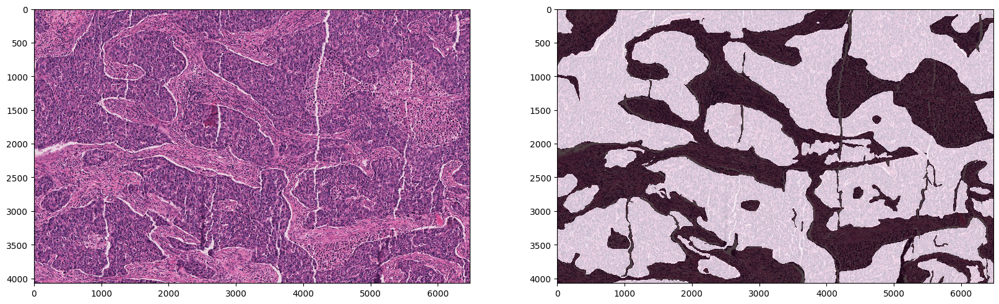

In [5]:
mfiltered = marray.copy()
mfiltered[marray != 1] = 0

plot_mask(iarray, mfiltered, alpha=0.7, threshold=0)

# <font color='green'>Cancer Instance Segmentation and Classification 1</font>

In [6]:
images = np.load(base_dir+'/Cancer Instance Segmentation and Classification 1/Part 1/Images/images.npy')
types = np.load(base_dir+'/Cancer Instance Segmentation and Classification 1/Part 1/Images/types.npy')
masks = np.load(base_dir+'/Cancer Instance Segmentation and Classification 1/Part 1/Masks/masks.npy')

print(images.shape)
print(types.shape)
print(masks.shape)

(2656, 256, 256, 3)
(2656,)
(2656, 256, 256, 6)


In [13]:
print(np.unique(types))

['Adrenal_gland' 'Bile-duct' 'Bladder' 'Breast' 'Cervix' 'Colon'
 'Esophagus' 'HeadNeck' 'Kidney' 'Liver' 'Lung' 'Ovarian' 'Pancreatic'
 'Prostate' 'Skin' 'Stomach' 'Testis' 'Thyroid' 'Uterus']


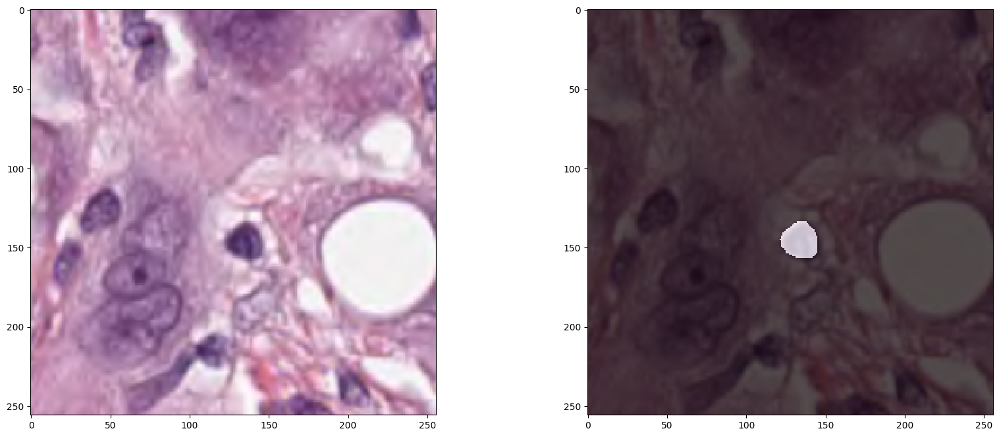

In [44]:
# 0 - Neoplastic cells - tumor
# 1 - Inflammatory
# 2 - Connective/Soft tissue cells
# 3 - Dead Cells
# 4 - Epithelial
# 5 - Background

plot_mask(images[1]/255.0, masks[1][:,:,0], alpha=0.7, threshold=0)